# Image Processing 101

Simple examples of image processing concepts on OpenCV. Concepts explored:

* Data structures
* Color and color conversions
* Thresholding and masking
* Blurring
* Contours and bounding rectangles
* Edges
* Hough Transforms

In [2]:
!wget -O images/coins.jpg https://upload.wikimedia.org/wikipedia/en/thumb/7/75/SA_Coins_1961-1964.JPG/1223px-SA_Coins_1961-1964.JPG

--2017-07-12 12:39:46--  https://upload.wikimedia.org/wikipedia/en/thumb/7/75/SA_Coins_1961-1964.JPG/1223px-SA_Coins_1961-1964.JPG
Resolving upload.wikimedia.org (upload.wikimedia.org)... 198.35.26.112, 2620:0:863:ed1a::2:b
Connecting to upload.wikimedia.org (upload.wikimedia.org)|198.35.26.112|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 177589 (173K) [image/jpeg]
Saving to: ‘images/coins.jpg’

images/coins.jpg    100%[===================>] 173.43K  15.7KB/s    in 12s     

2017-07-12 12:40:00 (14.5 KB/s) - ‘images/coins.jpg’ saved [177589/177589]



In [1]:
!ls images

0064.jpg	     desert.jpg		paste2_image.png  resized-desert.jpg
0074.jpg	     flower.jpg		paste5_image.png  resized-flower.jpg
20170622-072016.png  input16.jpg	paste6_image.png  spider2_.png
coins.jpg	     jungle2.png	paste7_image.png  TEMP-img.png
cropped-flower.jpg   manual_desert.jpg	paste8_image.png  test1.png
crop_specsimage.png  ophanannie.jpg	paste_image.png   test.png


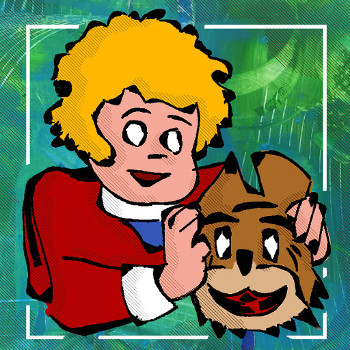

In [3]:
import Mimages
from Mimages import pic
pic.load("images/ophanannie.jpg")

In [13]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

## Basic data structures in OpenCV

In [5]:
# read an image
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
img = cv2.imread('images/coins.jpg')

cv2.imwrite("images/coins.png", img)

True

In [6]:
# read an image
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
img = cv2.imread('images/ophanannie.jpg')

# show image format (basically a 3-d array of pixel color info, in BGR format)
print(img)

[[[ 91 125  25]
  [ 88 125  23]
  [ 96 119  34]
  ..., 
  [105 150  47]
  [112 161  39]
  [115 153  63]]

 [[104 127  21]
  [ 96 125  39]
  [136 135  37]
  ..., 
  [ 87 122  65]
  [ 96 143  45]
  [127 180  63]]

 [[ 93 109  32]
  [128 130  30]
  [139 123  23]
  ..., 
  [125 189  63]
  [ 78 119  62]
  [ 94 152  43]]

 ..., 
 [[130 134  45]
  [ 71 117  58]
  [140 170  43]
  ..., 
  [ 55  63  52]
  [179 133  38]
  [158 127   6]]

 [[117 189  35]
  [133 149  62]
  [ 85 134  52]
  ..., 
  [177 140  26]
  [ 83  82  48]
  [162 127  23]]

 [[110 171  75]
  [127 181  60]
  [127 164  42]
  ..., 
  [154 128  28]
  [172 135  15]
  [ 83  72  44]]]


### Colors and color conversions

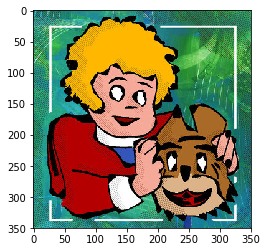

In [7]:
# convert image to RGB color for matplotlib
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
img = cv2.imread('images/ophanannie.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# show image with matplotlib
plt.imshow(img)

In [8]:
# convert image to grayscale
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
img = cv2.imread('images/ophanannie.jpg')
gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# grayscale image represented as a 2-d array
print(gray_img)

[[ 91  90  91 ..., 114 119 122]
 [ 93  96 106 ..., 101 108 139]
 [ 84 100  95 ..., 144  97 113]
 ..., 
 [107  94 129 ...,  59 110  94]
 [135 121 104 ..., 110  72 100]
 [135 139 123 ..., 101 103  65]]


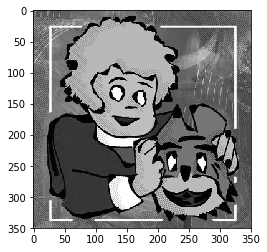

In [9]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
# have to convert grayscale back to RGB for plt.imshow()
plt.imshow(cv2.cvtColor(gray_img, cv2.COLOR_GRAY2RGB))

### Finding the average color of an image

In [12]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
img = cv2.imread('images/ophanannie.jpg')
# find average per row
# np.average() takes in an axis argument which finds the average across that axis. 
average_color_per_row = np.average(img, axis=0)

# find average across average per row
average_color = np.average(average_color_per_row, axis=0)

# convert back to uint8
average_color = np.uint8(average_color)
print(average_color)


[ 77 115 114]


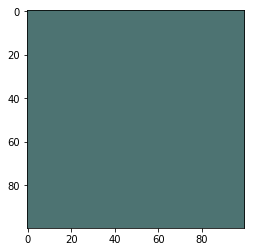

In [13]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
img = cv2.imread('images/ophanannie.jpg')
# create 100 x 100 pixel array with average color value
average_color_img = np.array([[average_color]*100]*100, np.uint8)

plt.imshow(average_color_img)

---

## Binary thresholding

Examples using thresholding on brightness/darkness of grayscale image and on color ranges


### Binary thresholding on grayscale image

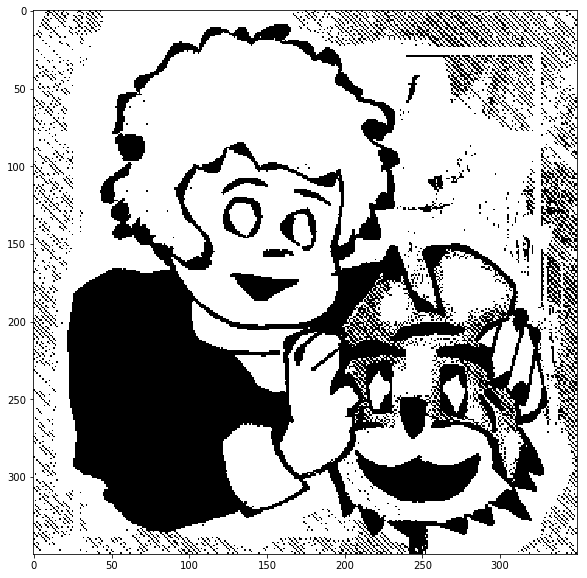

In [24]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

img = cv2.imread('images/ophanannie.jpg')
gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# Threshold for grayscale image
# Binary is black and white only no gray
_, threshold_img = cv2.threshold(gray_img, 90, 255, cv2.THRESH_BINARY)
# The 255 in the above line makes pure white 
# Any number lower than 255 makes the background a shade of gray ( bad mask )
# The 60 makes a threshold of where the white starts
threshold_img = cv2.cvtColor(threshold_img, cv2.COLOR_GRAY2RGB)
# Notice the next line to increase the plot viewing area
plt.figure(figsize=(10,10))
plt.imshow(threshold_img)

True

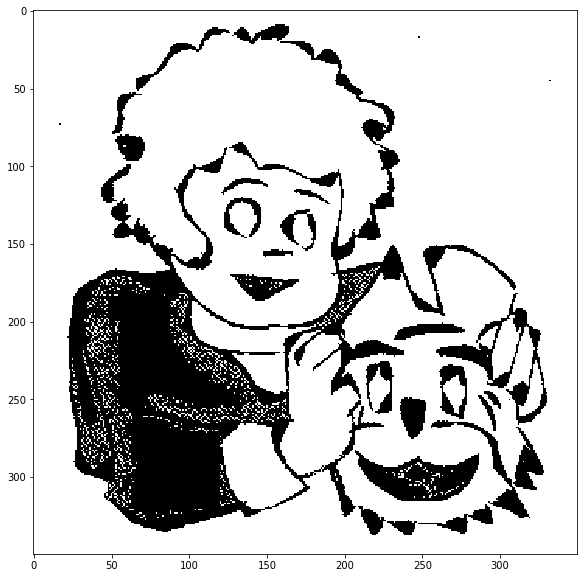

In [113]:
#Here the threshold is changed the 90 is changed to 25

import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

img = cv2.imread('images/ophanannie.jpg')
gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# Threshold for grayscale image
# Binary is black and white only no gray
#_, threshold_img = cv2.threshold(gray_img, 60, 255, cv2.THRESH_BINARY)

_, threshold_img = cv2.threshold(gray_img, 25, 255, cv2.THRESH_BINARY)

threshold_img = cv2.cvtColor(threshold_img, cv2.COLOR_GRAY2RGB)
#Notice the next line to increase the plot viewing area
plt.figure(figsize=(10,10))
plt.imshow(threshold_img)

cv2.imwrite('images/mask_annie.png', threshold_img)

### Binary thresholding on color

In [26]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
# open new fractal image
fract = cv2.imread('images/0064.jpg')
fract_hsv = cv2.cvtColor(fract, cv2.COLOR_BGR2HSV)

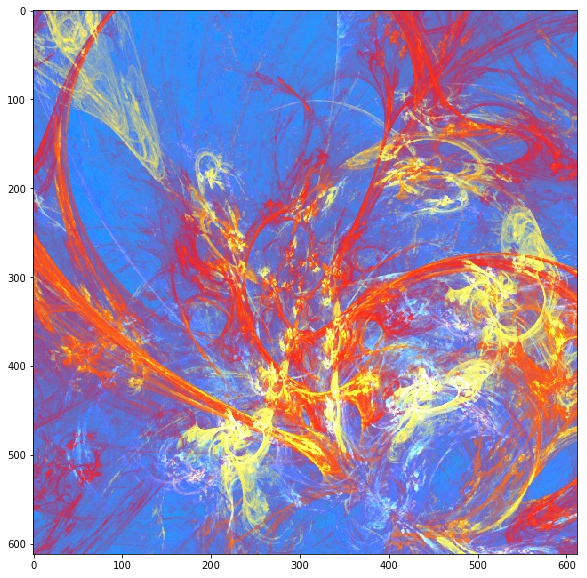

In [27]:
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(fract, cv2.COLOR_BGR2RGB))

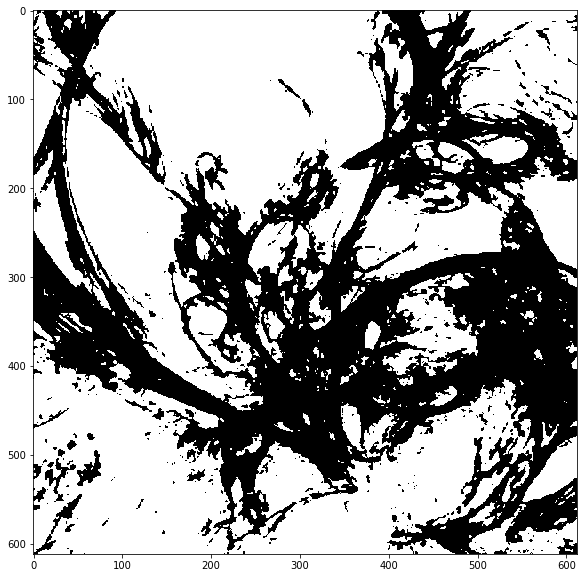

In [28]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
# threshold for hue channel in blue range
blue_min = np.array([85, 60, 60], np.uint8)
blue_max = np.array([150, 255, 255], np.uint8)
threshold_blue_img = cv2.inRange(fract_hsv, blue_min, blue_max)

# show threshold bits
threshold_blue_img = cv2.cvtColor(threshold_blue_img, cv2.COLOR_GRAY2RGB)
plt.figure(figsize=(10,10))
plt.imshow(threshold_blue_img)

### Using binary thresholding to obtain an image mask

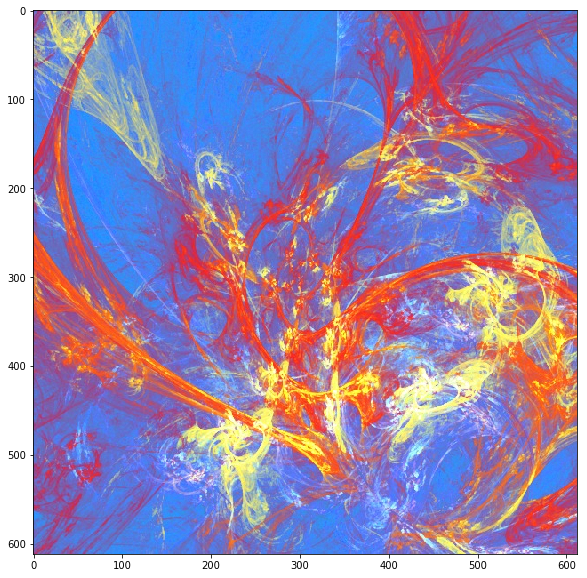

In [29]:
upstate = cv2.imread('images/0064.jpg')
upstate_hsv = cv2.cvtColor(upstate, cv2.COLOR_BGR2HSV)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(upstate_hsv, cv2.COLOR_HSV2RGB))

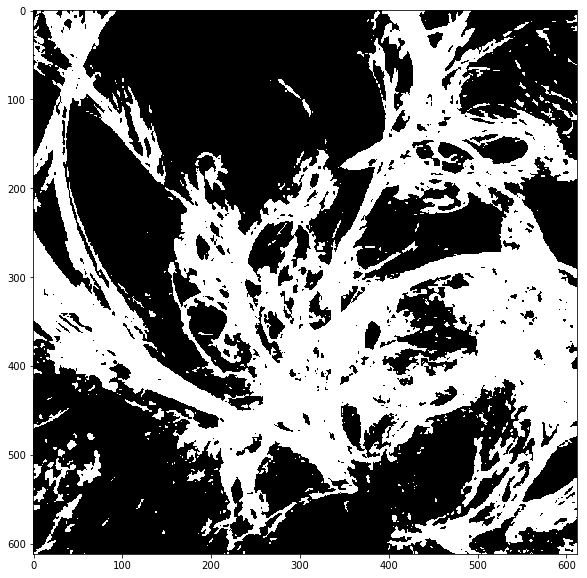

In [31]:
mask_inverse = cv2.inRange(upstate_hsv, blue_min, blue_max)
mask = cv2.bitwise_not(mask_inverse)

plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB))


True

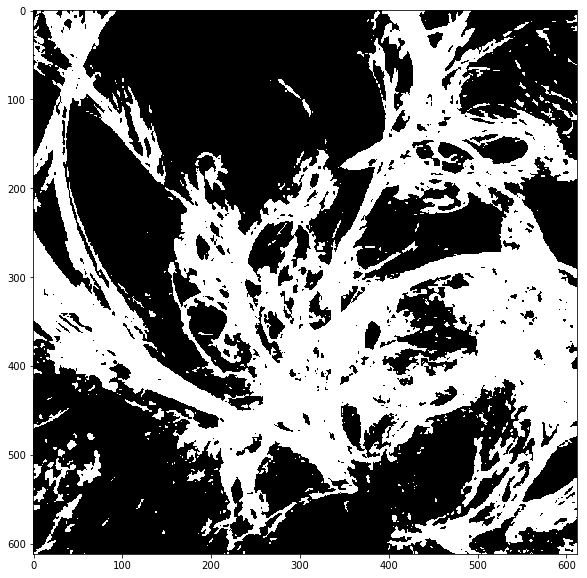

In [107]:
from PIL import Image
mask_inverse = cv2.inRange(upstate_hsv, blue_min, blue_max)
mask = cv2.bitwise_not(mask_inverse)

plt.figure(figsize=(10,10))

bw = plt.imshow(cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB))
cv2.imwrite('imagesXXX.png', mask)

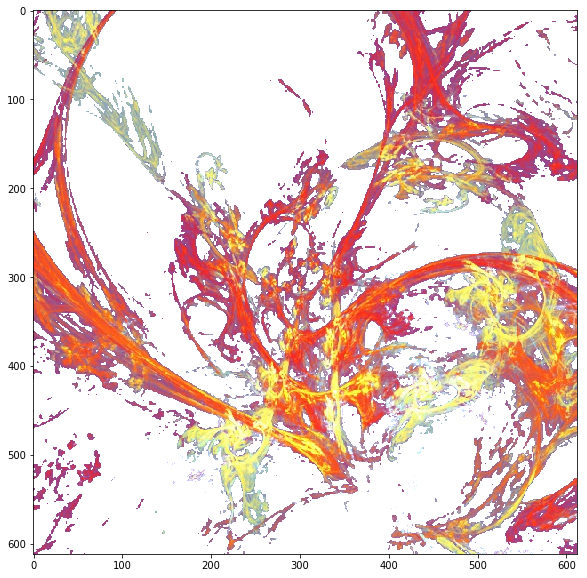

In [32]:
# convert single channel mask back into 3 channels
mask_rgb = cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB)

# perform bitwise and on mask to obtain cut-out image that is not blue
masked_upstate = cv2.bitwise_and(upstate, mask_rgb)

# replace the cut-out parts with white
masked_replace_white = cv2.addWeighted(masked_upstate, 1, \
                                       cv2.cvtColor(mask_inverse, cv2.COLOR_GRAY2RGB), 1, 0)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(masked_replace_white, cv2.COLOR_BGR2RGB))

# All-In-One Mask

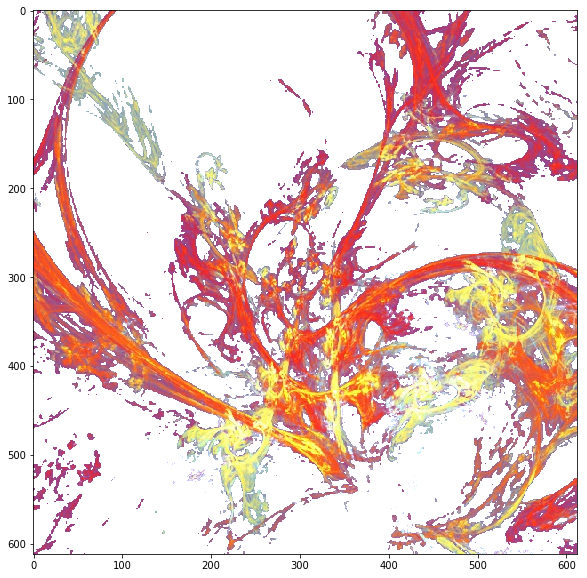

In [33]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
# open new fractal image
fract = cv2.imread('images/0064.jpg')
fract_hsv = cv2.cvtColor(fract, cv2.COLOR_BGR2HSV)
# threshold for blue range
blue_min = np.array([85, 60, 60], np.uint8)
blue_max = np.array([150, 255, 255], np.uint8)
threshold_blue_img = cv2.inRange(fract_hsv, blue_min, blue_max)

threshold_blue_img = cv2.cvtColor(threshold_blue_img, cv2.COLOR_GRAY2RGB)


#mask_inverse = cv2.inRange(upstate_hsv, blue_min, blue_max)
mask_inverse = cv2.inRange(fract_hsv, blue_min, blue_max)
mask = cv2.bitwise_not(mask_inverse)

# convert single channel mask back into 3 channels
mask_rgb = cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB)

# perform bitwise and on mask to obtain cut-out image that is not blue
masked_upstate = cv2.bitwise_and(fract, mask_rgb)

# replace the cut-out parts with white
masked_replace_white = cv2.addWeighted(masked_upstate, 1, \
                                       cv2.cvtColor(mask_inverse, cv2.COLOR_GRAY2RGB), 1, 0)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(masked_replace_white, cv2.COLOR_BGR2RGB))


---

## Gaussian Blur

Gaussian blurring in action, and how it makes a difference in the binary image that it produces

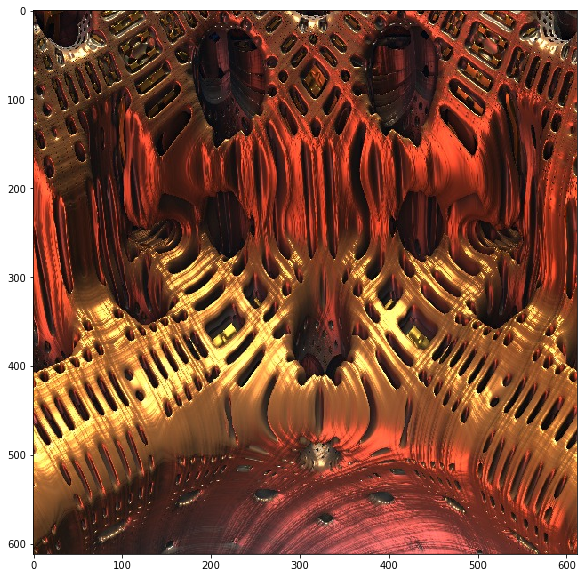

In [34]:
img = cv2.imread('images/0074.jpg')

plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))


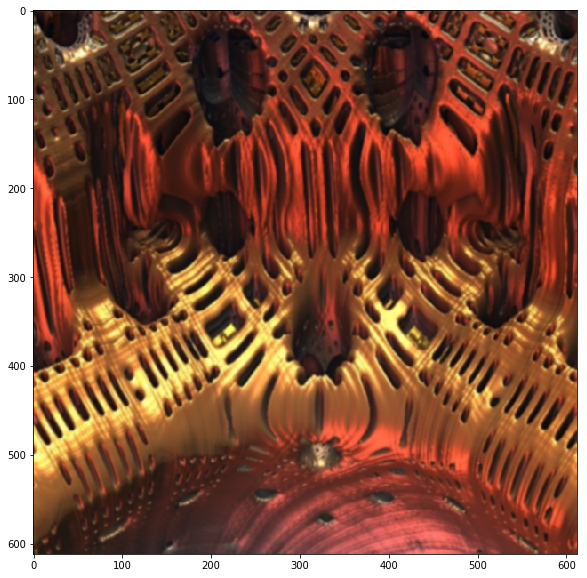

In [35]:
# preproccess with blurring, with 5x5 kernel
img_blur_small = cv2.GaussianBlur(img, (5,5), 0)
cv2.imwrite('output/0074.jpg', img_blur_small)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(img_blur_small, cv2.COLOR_BGR2RGB))

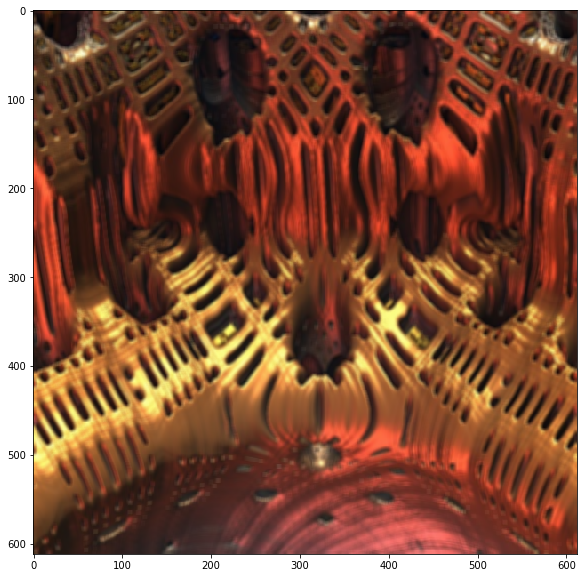

In [36]:
img_blur_small = cv2.GaussianBlur(img, (5,5), 25)
cv2.imwrite('output/0074.jpg', img_blur_small)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(img_blur_small, cv2.COLOR_BGR2RGB))

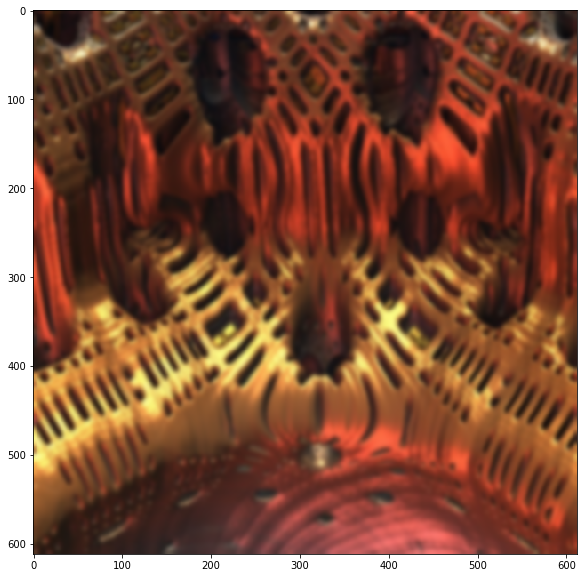

In [37]:
img_blur_large = cv2.GaussianBlur(img, (15,15), 0)
cv2.imwrite('output/0074.jpg', img_blur_large)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(img_blur_large, cv2.COLOR_BGR2RGB))

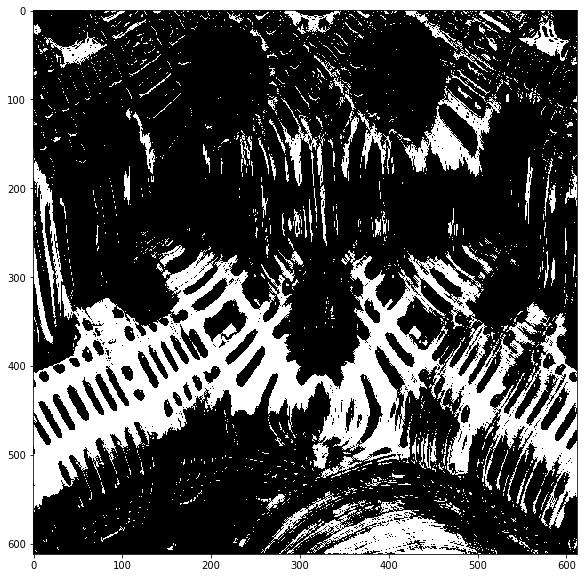

In [38]:
# threshold on regular image
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_, threshold_img = cv2.threshold(gray_img, 100, 255, cv2.THRESH_BINARY)
cv2.imwrite('output/0075b.jpg', threshold_img)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(threshold_img, cv2.COLOR_GRAY2RGB))

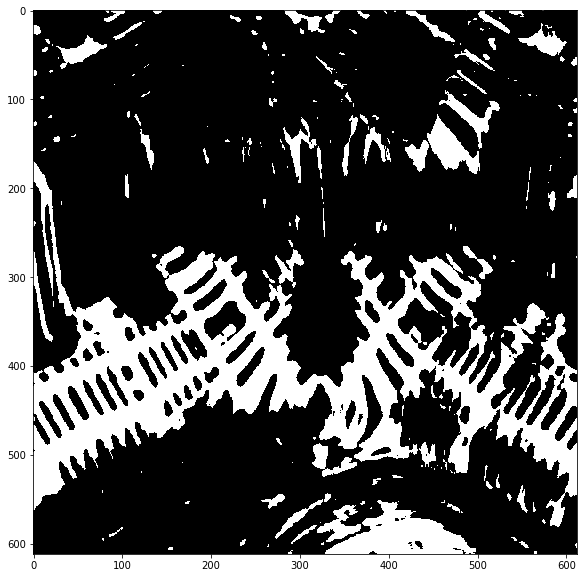

In [39]:
#threshold on blurred image
gray_blur_img = cv2.cvtColor(img_blur_small, cv2.COLOR_BGR2GRAY)
_, threshold_img_blur = cv2.threshold(gray_blur_img, 100, 255, cv2.THRESH_BINARY)
cv2.imwrite('output/0075tblur.jpg', threshold_img_blur)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(threshold_img_blur, cv2.COLOR_GRAY2RGB))

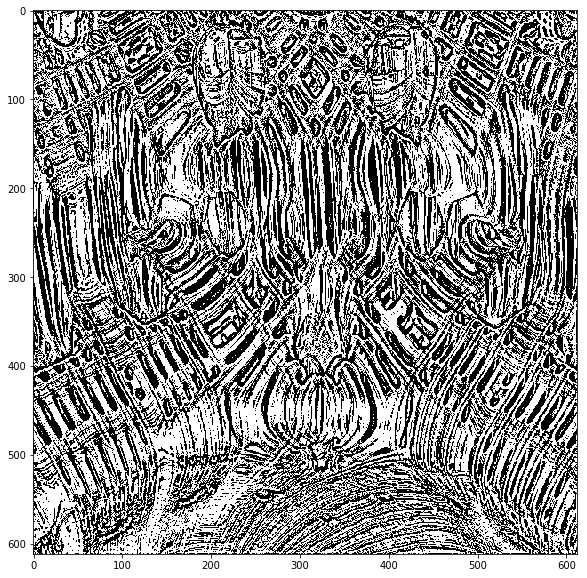

In [40]:
# using adaptive threshold instead of global
adaptive_thresh = cv2.adaptiveThreshold(gray_img,255,\
                                         cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
                                         cv2.THRESH_BINARY,11,2)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(adaptive_thresh, cv2.COLOR_GRAY2RGB))

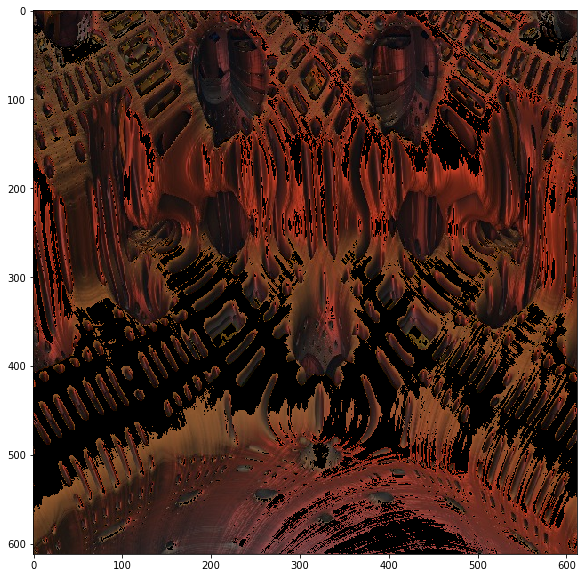

In [36]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

img = cv2.imread('images/0074.jpg')
#gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#adaptive_thresh = cv2.adaptiveThreshold(gray_img,255,\
#                                         cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
#                                         cv2.THRESH_BINARY,11,2)


gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_, threshold_img = cv2.threshold(gray_img, 100, 255, cv2.THRESH_BINARY)

mask = cv2.bitwise_not(threshold_img)

# convert single channel mask back into 3 channels
mask_rgb = cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB)

# perform bitwise and on mask to obtain cut-out image that is not blue
masked_upstate = cv2.bitwise_and(img, mask_rgb)

plt.figure(figsize=(10,10))
# View with white instead of black - example below:

plt.imshow(cv2.cvtColor(masked_upstate, cv2.COLOR_BGR2RGB))

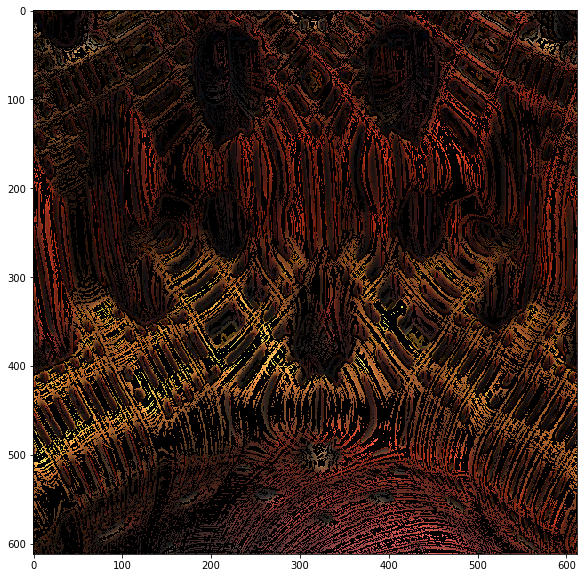

In [41]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

img = cv2.imread('images/0074.jpg')
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
adaptive_thresh = cv2.adaptiveThreshold(gray_img,255,\
                                         cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
                                         cv2.THRESH_BINARY,11,2)
mask = cv2.bitwise_not(adaptive_thresh)

# convert single channel mask back into 3 channels
mask_rgb = cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB)

# perform bitwise and on mask to obtain cut-out image that is not blue
masked_upstate = cv2.bitwise_and(img, mask_rgb)

plt.figure(figsize=(10,10))
# View with white instead of black - example below:

plt.imshow(cv2.cvtColor(masked_upstate, cv2.COLOR_BGR2RGB))

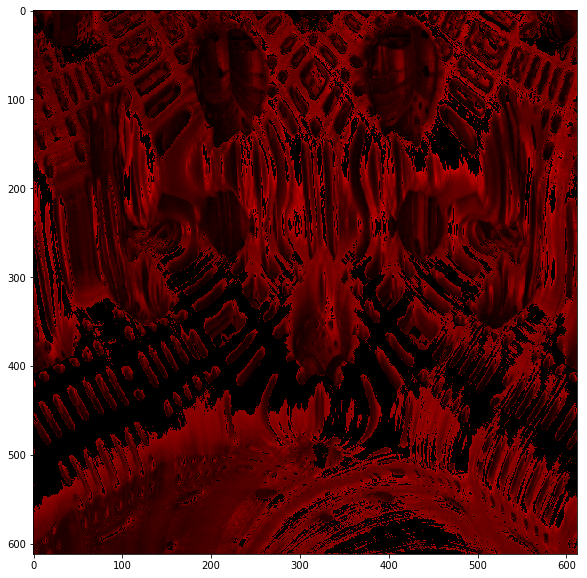

In [45]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

img = cv2.imread('images/0074.jpg')
#gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#adaptive_thresh = cv2.adaptiveThreshold(gray_img,255,\
#                                         cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
#                                         cv2.THRESH_BINARY,11,2)


gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
_, threshold_img = cv2.threshold(gray_img, 100, 255, cv2.THRESH_BINARY)

mask = cv2.bitwise_not(threshold_img)

# convert single channel mask back into 3 channels
mask_rgb = cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB)

# perform bitwise and on mask to obtain cut-out image that is not blue

mask_rgb[mask == 255] = [0, 0, 255]
masked_upstate = cv2.bitwise_and(img, mask_rgb)




plt.figure(figsize=(10,10))
# View with white instead of black - example below:


cv2.imwrite('images/red.jpg', masked_upstate)
plt.imshow(cv2.cvtColor(masked_upstate, cv2.COLOR_BGR2RGB))



In [46]:
# Make the black transparent
import cv2
file_name = "images/red.jpg"
src = cv2.imread(file_name, 1)
tmp = cv2.cvtColor(src, cv2.COLOR_BGR2GRAY)
_,alpha = cv2.threshold(tmp,20,255,cv2.THRESH_BINARY)
b, g, r = cv2.split(src)
rgba = [b,g,r, alpha]
dst = cv2.merge(rgba,4)
cv2.imwrite("images/test.png", dst)

True

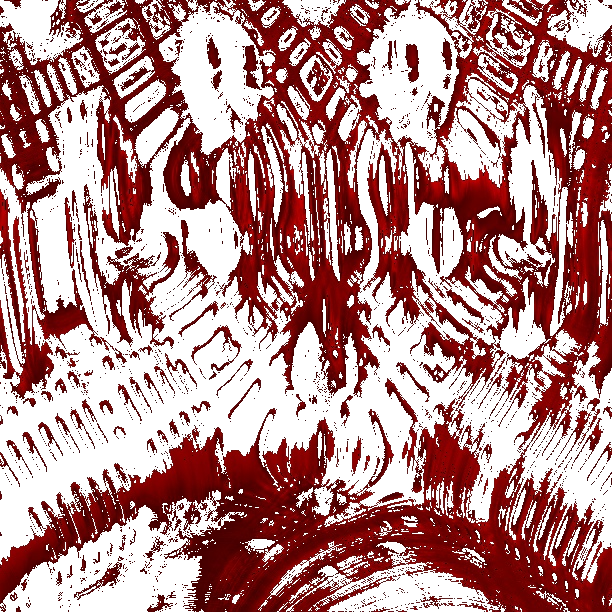

In [47]:
#View the new transparent image
from PIL import Image
newIM =Image.open("images/test.png")
newIM

In [48]:
import numpy as np
import cv2

img1 = cv2.imread("images/test1.png", -1)
img2 = cv2.imread("images/test.png", -1) # this one has transparency
h, w, depth = img2.shape

result = np.zeros((h, w, 3), np.uint8)

for i in range(h):
    for j in range(w):
        color1 = img1[i, j]
        color2 = img2[i, j]
        alpha = color2[3] / 255.0
        new_color = [ (1 - alpha) * color1[0] + alpha * color2[0],
                      (1 - alpha) * color1[1] + alpha * color2[1],
                      (1 - alpha) * color1[2] + alpha * color2[2] ]
        result[i, j] = new_color

cv2.imshow("result", result)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [130]:
import os
import Mimages
from Mimages import pic
help(Mimages.pic)

Help on module Mimages.pic in Mimages:

NAME
    Mimages.pic

FILE
    /home/jack/anaconda2/lib/python2.7/site-packages/Mimages/pic.py

FUNCTIONS
    blend(image1='640.png', image2='640spider.png', alpha=0.5, mimsave='spider_new.png')
        # Usage blend(image1, image2, alpha_blend(0-1), save_as)
        # Usage blend("640.png", "640spider.png", .5, "spider_new.png")
        #images must match size and format
    
    load(img)




In [67]:
import cv2
help(cv2)

Help on module cv2:

NAME
    cv2

FILE
    /home/jack/anaconda2/lib/python2.7/site-packages/cv2.so

SUBMODULES
    Error
    aruco
    bgsegm
    bioinspired
    cuda
    datasets
    detail
    dnn
    face
    fisheye
    flann
    freetype
    ft
    hdf
    instr
    line_descriptor
    ml
    motempl
    multicalib
    ocl
    ogl
    omnidir
    optflow
    plot
    ppf_match_3d
    rgbd
    saliency
    structured_light
    text
    videostab
    xfeatures2d
    ximgproc
    xphoto

CLASSES
    __builtin__.object
        UMat
    exceptions.Exception(exceptions.BaseException)
        error
    
    class UMat(__builtin__.object)
     |  OpenCV 3 UMat wrapper. Used for T-API support.
     |  
     |  Methods defined here:
     |  
     |  __init__(...)
     |      x.__init__(...) initializes x; see help(type(x)) for signature
     |  
     |  get(...)
     |      Returns numpy array
     |  
     |  ----------------------------------------------------------------------
     |  D

In [128]:
#%%writefile /home/jack/anaconda2/lib/python2.7/site-packages/Mimages/pic.py
#!/home/jack/anaconda2/bin/python
import importlib
from PIL import Image
import sys
sys.path.insert(1, "/home/jack/anaconda2/lib/python2.7/site-packages/cv2.so")
import cv2
def load(img):
        #seeit = Image.open("Mimages/stuff/desert.jpg")
        seeit = Image.open(img)
        #seeit = Image.open("Mimages/stuff/desert.jpg")
        return seeit
        load(image)
        seeit
# Usage blend(image1, image2, alpha_blend(0-1), save_as)
# Usage blend("640.png", "640spider.png", .5, "spider_new.png")
#images must match size and format 
def blend(image1="images/640.png", image2="images/640spider.png", alpha=.5, mimsave="images/spider_new.png"):
        im1 = Image.open(image1)
        im2 = Image.open(image2)
        mimage_out = Image.blend(im1, im2, alpha)
        mimage_out.save(mimsave)
        
        

In [125]:
def blend(image1, image2, alpha, mimsave):
        im1 = Image.open(image1)
        im2 = Image.open(image2)
        mimage_out = Image.blend(im1, im2, alpha)
        mimage_out.save(mimsave)
        

In [134]:
!cp 640spider.png /home/jack/anaconda2/lib/python2.7/site-packages/Mimages

In [126]:
def blend(image1="images/640.png", image2="images/640spider.png", alpha=.5, mimsave="images/spider_new.png"):
        im1 = Image.open(image1)
        im2 = Image.open(image2)
        mimage_out = Image.blend(im1, im2, alpha)
        mimage_out.save(mimsave)
        

In [129]:
import Mimages
pic.load("images/spider_new.png")

IOError: [Errno 2] No such file or directory: 'images/spider_new.png'

In [131]:
from Mimages import pic
#blend("merged_test1-test2.png", "TEMP-img.png", .5, "spider_.png")
blend("images/TEMP-img.png", "images/20170622-072016.png", .5, "images/XXspider2_.png")




In [132]:
from Mimages import pic
#blend("merged_test1-test2.png", "TEMP-img.png", .5, "spider_.png")
blend("images/TEMP-img.png", "images/20170622-072016.png", .5, "images/XXspider2_.png")




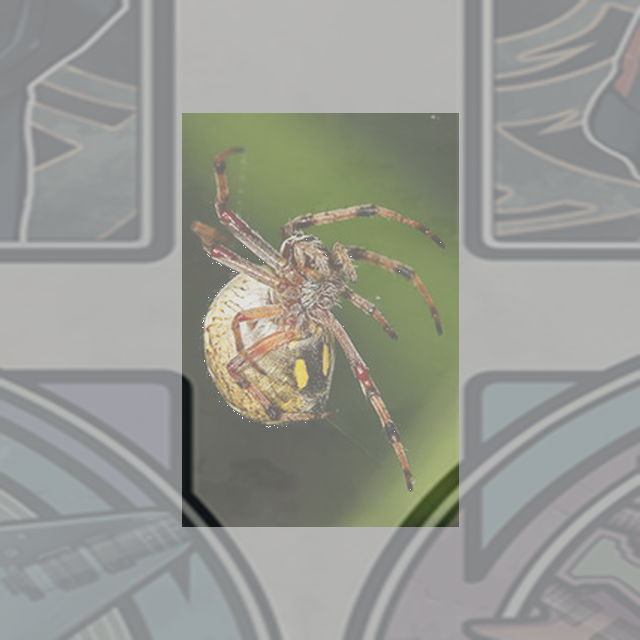

In [133]:
from Mimages import pic
pic.load("images/XXspider2_.png")
#pic.load("spider_.png")

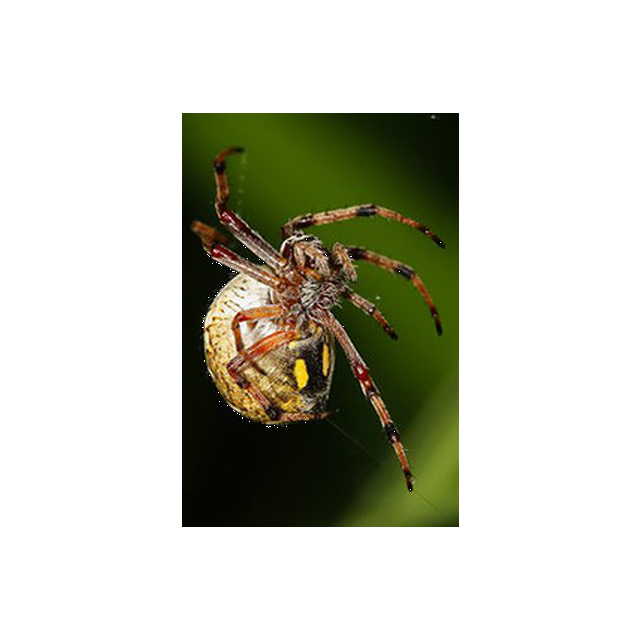

In [59]:
from Mimages import pic
pic.load("images/20170622-072016.png")
#pic.load("spider_.png")

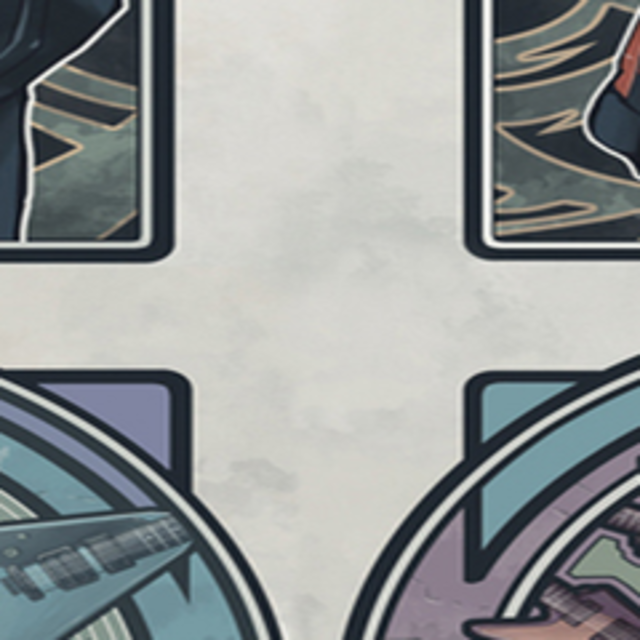

In [60]:
from Mimages import pic
pic.load("images/TEMP-img.png")
#pic.load("spider_.png")

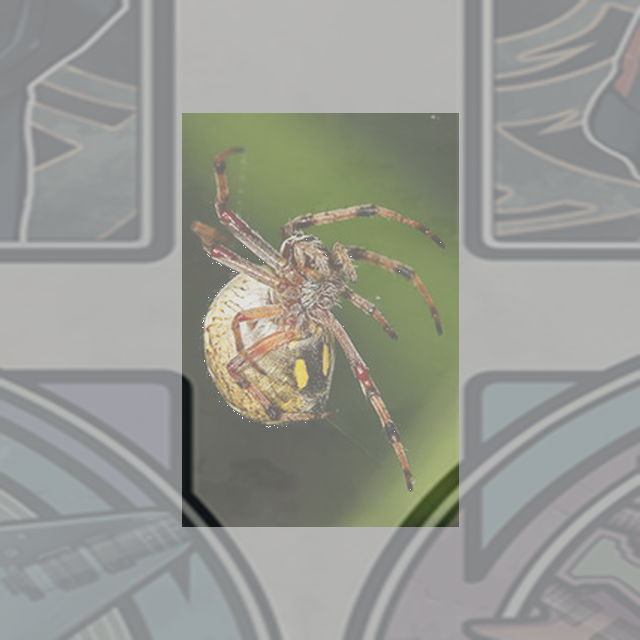

In [61]:
from Mimages import pic
pic.load("images/spider2_.png")
#pic.load("spider_.png")

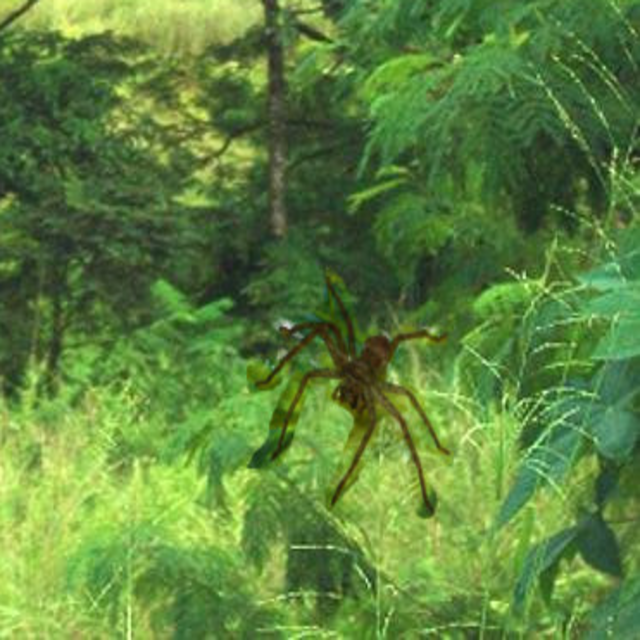

In [62]:
from Mimages import pic
pic.load("images/jungle2.png")

In [63]:
!ls *.png


coins.png  test.png


In [85]:
#%%writefile 
import numpy as np
import cv2

def blend_transparent(face_imgi, overlay_t_imgo, result_savs):
    import cv2
    
    face_img = cv2.imread(face_imgi)
    overlay_t_img = cv2.imread(overlay_t_imgo, -1) # Load with transparency
    result_sav = result_savs
    
    # Split out the transparency mask from the colour info
    overlay_img = overlay_t_img[:,:,:3] # Grab the BRG planes
    overlay_mask = overlay_t_img[:,:,3:]  # And the alpha plane

    # Again calculate the inverse mask
    background_mask = 255 - overlay_mask

    # Turn the masks into three channel, so we can use them as weights
    overlay_mask = cv2.cvtColor(overlay_mask, cv2.COLOR_GRAY2BGR)
    background_mask = cv2.cvtColor(background_mask, cv2.COLOR_GRAY2BGR)

    # Create a masked out face image, and masked out overlay
    # We convert the images to floating point in range 0.0 - 1.0
    face_part = (face_img * (1 / 255.0)) * (background_mask * (1 / 255.0))
    overlay_part = (overlay_img * (1 / 255.0)) * (overlay_mask * (1 / 255.0))

    # And finally just add them together, and rescale it back to an 8bit integer image    
    result = np.uint8(cv2.addWeighted(face_part, 255.0, overlay_part, 255.0, 0.0))
    return result
    result
    #face_img = cv2.imread("test1.png")
    #overlay_t_img = cv2.imread("test.png", -1) # Load with transparency
    #result_sav = "XX_test1-test2.png"
    #result = np.uint8(cv2.addWeighted(face_part, 255.0, overlay_part, 255.0, 0.0))    
    #blend_transparent(face_img, overlay_t_img, result_sav)
    
    


In [88]:

blend_transparent("images/TEMP-img.png", "images/trans.png", "images/zzzzz2.png")

cv2.imwrite("images/zzzzz2.png", result)

True

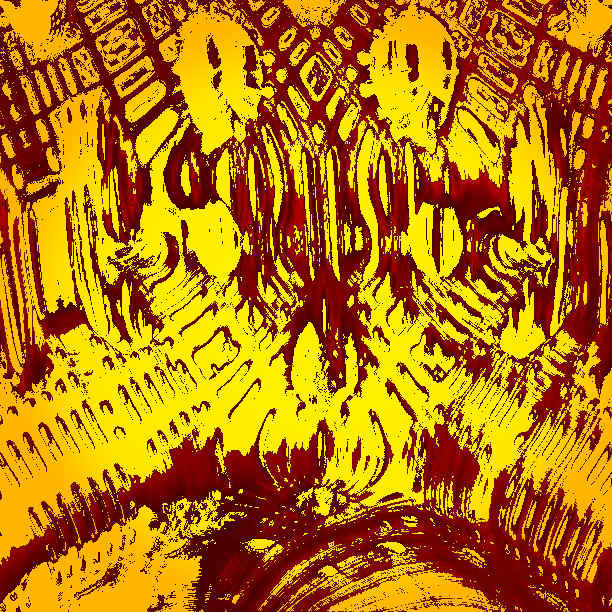

In [109]:
from Mimages import pic
pic.load("images/zzzzz2.png")

In [111]:
!ls images

0064.jpg	     flower.jpg		paste7_image.png    test1.png
0074.jpg	     input16.jpg	paste8_image.png    test.png
20170622-072016.png  jungle2.png	paste_image.png     trans.png
coins.jpg	     manual_desert.jpg	red.jpg		    XXspider2_.png
coins.png	     ophanannie.jpg	resized-desert.jpg  XXXX.png
cropped-flower.jpg   paste2_image.png	resized-flower.jpg  zzzzz2.png
crop_specsimage.png  paste5_image.png	spider2_.png
desert.jpg	     paste6_image.png	TEMP-img.png


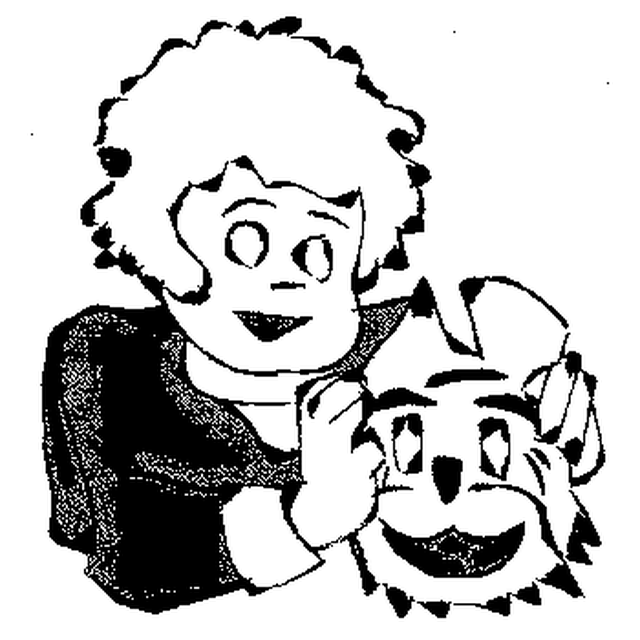

In [115]:
# A totally manual resize - it will resize reguardless of original aspect
import PIL
from PIL import Image
im0 = Image.open("images/mask_annie.png")
#longer_side = max(im1.size)
basewidth = 640
hsize = 640
man = im0.resize((basewidth, hsize), PIL.Image.ANTIALIAS)
man.save("images/XXmask_annie.png")
man

In [147]:
#WORKS  Top cell must be run first

import Mimages
face_imgi = "images/jungle2.png"
overlay_t_imgo = "images/XXmask_annie.png"
result_savs = "images/XXmask_annie.png"

blend("images/jungle2.png","images/XXmask_annie.png", .9, "images/zzmask_annie.png")


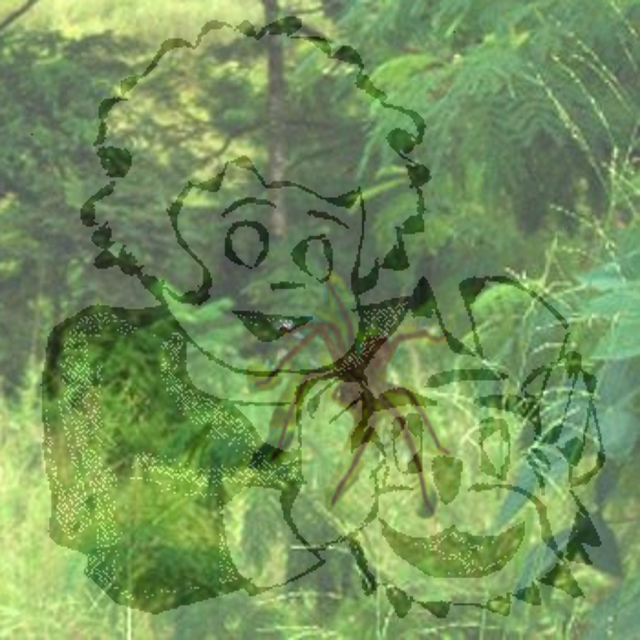

In [148]:
from Mimages import pic
pic.load("images/zzmask_annie.png")

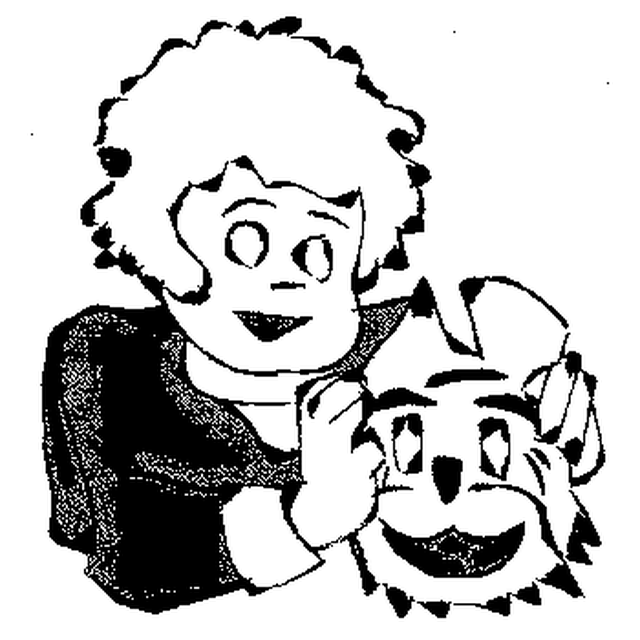

In [118]:
from Mimages import pic
pic.load("images/XXmask_annie.png")

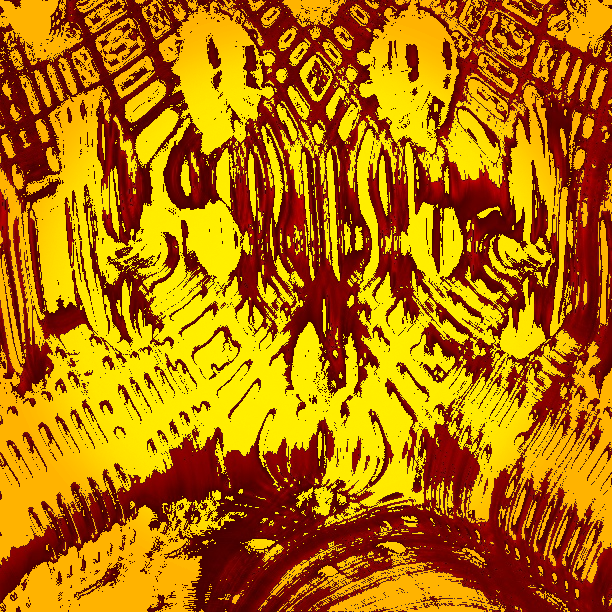

In [73]:
from Mimages import pic
pic.load("SSXX_test1-test2.png")

In [207]:
from PIL import Image
im = Image.open("images/sized_0025.png")
im.size

(612, 612)

In [208]:
from PIL import Image
im = Image.open("images/spider2.png")
im.size

(612, 612)

In [175]:
from PIL import Image
basewidth = 612
hsize = 612

img = im.resize((basewidth, hsize), PIL.Image.ANTIALIAS)
img.save("images/spider2.png")

In [165]:
!ls images/ *.png

!!_test1-test2.png

images/:
0025.jpg	     desert.jpg		paste6_image.png    test1.png
0064.jpg	     flower.jpg		paste7_image.png    test.png
0074.jpg	     imagesXXX.png	paste8_image.png    trans.png
20170622-072016.png  input16.jpg	paste_image.png     XXmask_annie.png
640.png		     jungle2.png	red.jpg		    XXspider2_.png
640spider.png	     manual_desert.jpg	resized-desert.jpg  XXXX2.png
coins.jpg	     mask_annie.png	resized-flower.jpg  XXXX.png
coins.png	     ophanannie.jpg	sized_0025.png	    zzmask_annie.png
cropped-flower.jpg   paste2_image.png	spider2_.png	    zzzzz2.png
crop_specsimage.png  paste5_image.png	TEMP-img.png


In [202]:
import Mimages
from Mimages import pic
import cv2
#face_img ="/home/jack/Desktop/deep-dream-generator/notebooks/images/0025.png"
#overlay_t_img = "/home/jack/Desktop/deep-dream-generator/notebooks/test.png"
#result_sav = "/home/jack/Desktop/deep-dream-generator/notebooks/!!_test1-test2.png"
pic.blend("images/sized_0025.png", "images/spider2.png", .8, "images/!!_test1-test2.png")

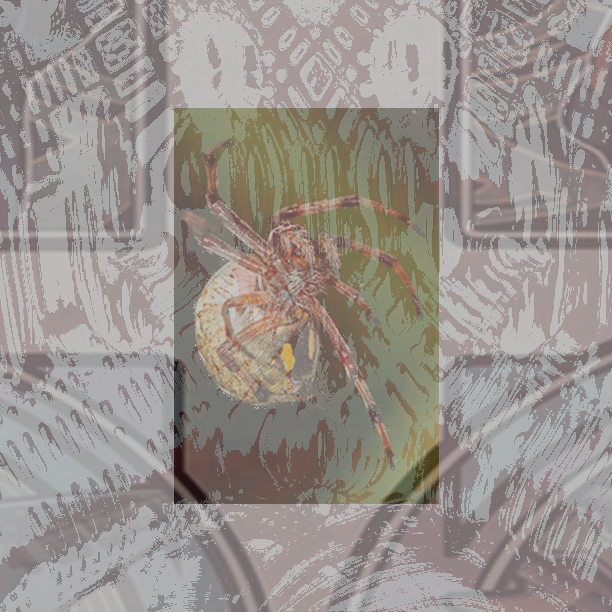

In [203]:
import Mimages
from Mimages import pic
pic.load("images/!!_test1-test2.png")

In [217]:
from PIL import Image

im = Image.open("images/trans.png")

basewidth = 612
hsize = 612

img = im.resize((basewidth, hsize), PIL.Image.ANTIALIAS)
img.save("images/612_trans.png")

In [218]:

import numpy as np
import cv2

def blend_transparent(face_img, overlay_t_img):
    # Split out the transparency mask from the colour info
    overlay_img = overlay_t_img[:,:,:3] # Grab the BRG planes
    overlay_mask = overlay_t_img[:,:,3:]  # And the alpha plane

    # Again calculate the inverse mask
    background_mask = 255 - overlay_mask

    # Turn the masks into three channel, so we can use them as weights
    overlay_mask = cv2.cvtColor(overlay_mask, cv2.COLOR_GRAY2BGR)
    background_mask = cv2.cvtColor(background_mask, cv2.COLOR_GRAY2BGR)

    # Create a masked out face image, and masked out overlay
    # We convert the images to floating point in range 0.0 - 1.0
    face_part = (face_img * (1 / 255.0)) * (background_mask * (1 / 255.0))
    overlay_part = (overlay_img * (1 / 255.0)) * (overlay_mask * (1 / 255.0))

    # And finally just add them together, and rescale it back to an 8bit integer image    
    return np.uint8(cv2.addWeighted(face_part, 255.0, overlay_part, 255.0, 0.0))

# We load the images
face_img = cv2.imread("images/test1.png")
overlay_t_img = cv2.imread("images/612_trans.png", -1) # Load with transparency

result_2 = blend_transparent(face_img, overlay_t_img)
cv2.imwrite("images/merged_test1-test2.png", result_2)



True

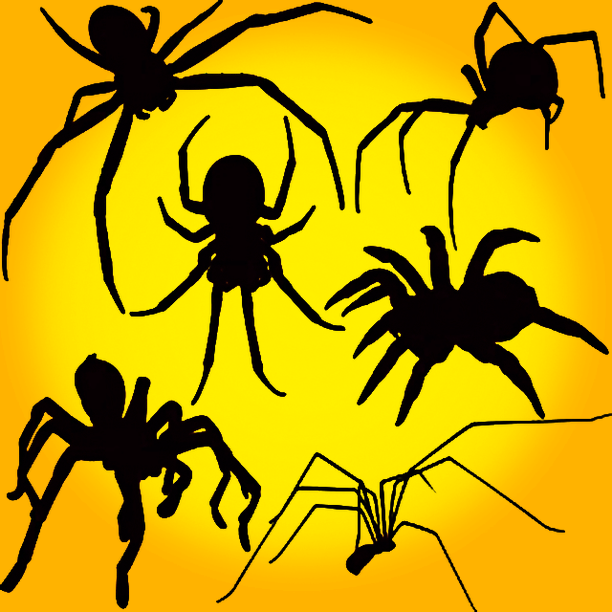

In [219]:
Op = Image.open("images/merged_test1-test2.png")
Op

In [ ]:
import cv2
import PIL
import numpy as np
from PIL import Image
image1 = Image.open("test1.png")
image2 = Image.open("test.png") 

new = Image.alpha_composite(image1, image2)
new

In [ ]:
import cv2
import PIL
import numpy as np
from PIL import Image
image1 = Image.open("test1.png")
image2 = Image.open("test.png") 
image3 = Image.open("output/0075tblur.jpg")
compim = Image.composite(image1, image2, image3)
compim

compim.save("compimange.jpg", "JPEG")

In [ ]:
#View the new transparent image
from PIL import Image
newIm =Image.open("compimange.jpg")
newIm

In [ ]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

img = cv2.imread('images/0074.jpg')
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
adaptive_thresh = cv2.adaptiveThreshold(gray_img,255,\
                                         cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
                                         cv2.THRESH_BINARY,11,2)
mask = cv2.bitwise_not(adaptive_thresh)
# convert single channel mask back into 3 channels
mask_rgb = cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB)

# perform bitwise and on mask to obtain cut-out image that is not blue
masked_upstate = cv2.bitwise_and(img, mask_rgb)

# replace the cut-out parts with white - experiment with the 1 in the added weight ( 1 - 255 )
masked_replace_white = cv2.addWeighted(masked_upstate, 2, \
                                       cv2.cvtColor(adaptive_thresh, cv2.COLOR_GRAY2RGB), 1, 0)

plt.figure(figsize=(10,10))

# View with white instead of black - plt.imshow(cv2.cvtColor(masked_replace_white, cv2.COLOR_BGR2RGB))
plt.imshow(cv2.cvtColor(masked_replace_white, cv2.COLOR_BGR2RGB))

In [ ]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline
# open new fractal image
fract = cv2.imread('images/0064.jpg')
# Convert to HSV
fract_hsv = cv2.cvtColor(fract, cv2.COLOR_BGR2HSV)
# Set threshold for blue range
blue_min = np.array([85, 60, 60], np.uint8)
blue_max = np.array([150, 255, 255], np.uint8)
# Create new object with blue thresholdapplied
#threshold_blue_img = cv2.inRange(fract_hsv, blue_min, blue_max)

#threshold_blue_img = cv2.cvtColor(threshold_blue_img, cv2.COLOR_GRAY2RGB)


#mask_inverse = cv2.inRange(upstate_hsv, blue_min, blue_max)
mask_inverse = cv2.inRange(fract_hsv, blue_min, blue_max)
mask = cv2.bitwise_not(mask_inverse)

# convert single channel mask back into 3 channels
mask_rgb = cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB)

# perform bitwise and on mask to obtain cut-out image that is not blue
masked_upstate = cv2.bitwise_and(fract, mask_rgb)

# replace the cut-out parts with white
masked_replace_white = cv2.addWeighted(masked_upstate, 1, \
                                       cv2.cvtColor(mask_inverse, cv2.COLOR_GRAY2RGB), 1, 0)
plt.figure(figsize=(10,10))

#(white background) - plt.imshow(cv2.cvtColor(masked_replace_white, cv2.COLOR_BGR2RGB))
#(black-background) - plt.imshow(cv2.cvtColor(masked_upstate, cv2.COLOR_BGR2RGB))
plt.imshow(cv2.cvtColor(masked_replace_white, cv2.COLOR_BGR2RGB))

---

## Contour and bounding boxes

In [221]:
import PIL
from PIL import Image

basewidth = 600
img = Image.open('images/coins.png')
wpercent = (basewidth/float(img.size[0]))
hsize = int((float(img.size[1])*float(wpercent)))
img = img.resize((basewidth,hsize), PIL.Image.ANTIALIAS)
img.save('images/coinS.png') 

True

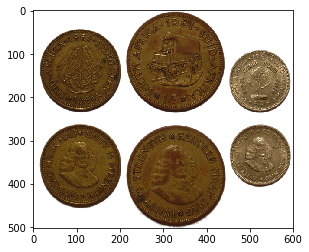

In [222]:
import matplotlib, cv2
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

coins = cv2.imread('images/coinS.png')
plt.imshow(cv2.cvtColor(coins, cv2.COLOR_BGR2RGB))
cv2.imwrite('images/coinS-orig.jpg', coins)

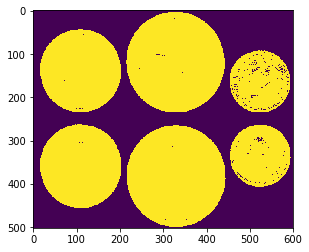

In [223]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
 
img = cv2.imread('images/coinS.png')
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret, thresh = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)

plt.imshow(thresh)

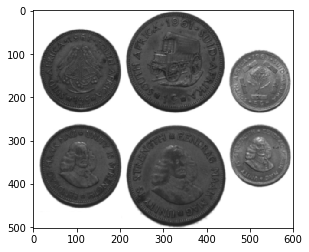

In [224]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
 
img = cv2.imread('images/coinS.png')
coins_gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

coins_preprocessed = cv2.GaussianBlur(coins_gray, (5, 5), 0)
plt.imshow(cv2.cvtColor(coins_preprocessed, cv2.COLOR_GRAY2RGB))

True

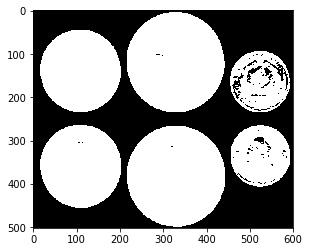

In [225]:
_, coins_binary = cv2.threshold(coins_preprocessed, 130, 255, cv2.THRESH_BINARY)

# invert image to get coins
coins_binary = cv2.bitwise_not(coins_binary)
plt.imshow(cv2.cvtColor(coins_binary, cv2.COLOR_GRAY2RGB))
cv2.imwrite('images/coins-binary.png', coins_binary)

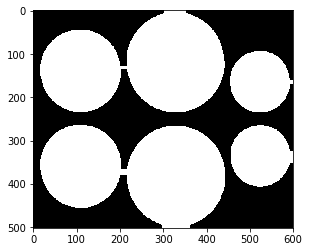

In [226]:
# morph coins by eroding and dilating to remove noise
morph_kernel = np.ones((15,15),np.uint8)
coins_morph = cv2.morphologyEx(coins_binary, cv2.MORPH_CLOSE, morph_kernel)

plt.imshow(cv2.cvtColor(coins_morph, cv2.COLOR_GRAY2RGB))

---
### Get countours

number of coins: 4


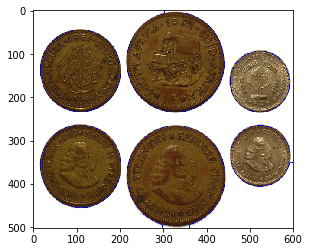

In [227]:
# find contours
_, coins_contours, _ = cv2.findContours(coins_morph, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# make copy of image
coins_and_contours = np.copy(coins)

# find contours of large enough area
min_coin_area = 10
large_contours = [cnt for cnt in coins_contours if cv2.contourArea(cnt) > min_coin_area]

# draw contours
cv2.drawContours(coins_and_contours, large_contours, -1, (255,0,0))

plt.imshow(cv2.cvtColor(coins_and_contours, cv2.COLOR_BGR2RGB))
cv2.imwrite('output/coins-contour.jpg', coins_and_contours)

# print number of contours
print('number of coins: %d' % len(large_contours))

In [229]:
import numpy as np
import cv2

# Load a color image
img = cv2.imread('images/0093.png', cv2.IMREAD_COLOR)

# Convert BGR to HSV
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

def nothing(x):
    pass

# Create a UI Window
cv2.namedWindow('Color Filter Parameters');

# Create trackbars
cv2.createTrackbar('H Max','Color Filter Parameters',0,255,nothing)
cv2.createTrackbar('H Min','Color Filter Parameters',0,255,nothing)
cv2.createTrackbar('S Max','Color Filter Parameters',0,255,nothing)
cv2.createTrackbar('S Min','Color Filter Parameters',0,255,nothing)
cv2.createTrackbar('V Max','Color Filter Parameters',0,255,nothing)
cv2.createTrackbar('V Min','Color Filter Parameters',0,255,nothing)

# Set the trackbar positions (default 0)
cv2.setTrackbarPos('H Max','Color Filter Parameters', 255)
cv2.setTrackbarPos('V Max','Color Filter Parameters', 255)
cv2.setTrackbarPos('S Max','Color Filter Parameters', 255)

while True :

    # Get all trackbar positions for filtering.
    h_max = cv2.getTrackbarPos('H Max','Color Filter Parameters')
    h_min = cv2.getTrackbarPos('H Min','Color Filter Parameters')
    s_max = cv2.getTrackbarPos('S Max','Color Filter Parameters')
    s_min = cv2.getTrackbarPos('S Min','Color Filter Parameters')
    v_max = cv2.getTrackbarPos('V Max','Color Filter Parameters')
    v_min = cv2.getTrackbarPos('V Min','Color Filter Parameters')

    # Threshold the HSV image.  Lower bounds and upper bounds must be numpy arrays
    # Our binary thresholded image is saved into mask
    mask = cv2.inRange(hsv, np.array([h_min, s_min, v_min]), np.array([h_max, s_max, v_max]))

    img2 = img.copy();
    # Bitwise-AND mask and original image
    # res = cv2.bitwise_and(img,img, mask= mask)

    # To draw a rectangle - image, point1, point2, color, line thickness
    # cv2.rectangle(res, (0,0), (50,50), (0,255,0),3)

    # To find contours of the thresholded image
    # im2, contours, hierarchy = cv2.findContours(mask,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)

    # Find the contours of our thresholded image
    im2, contours, hierarchy = cv2.findContours(mask,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)

    areas = [cv2.contourArea(c) for c in contours]
    max_index = np.argmax(areas)
    cnt=contours[max_index]
    x,y,w,h = cv2.boundingRect(cnt)
    cv2.rectangle(img2,(x,y),(x+w,y+h),(0,255,0),2)

    cv2.imshow('image',img2)
    # cv2.imshow('mask',mask)
    # cv2.imshow('res',res)
    k = cv2.waitKey(30) & 0xFF
    if k == 27:
        break

cv2.destroyAllWindows()

### Find bounding boxes

True

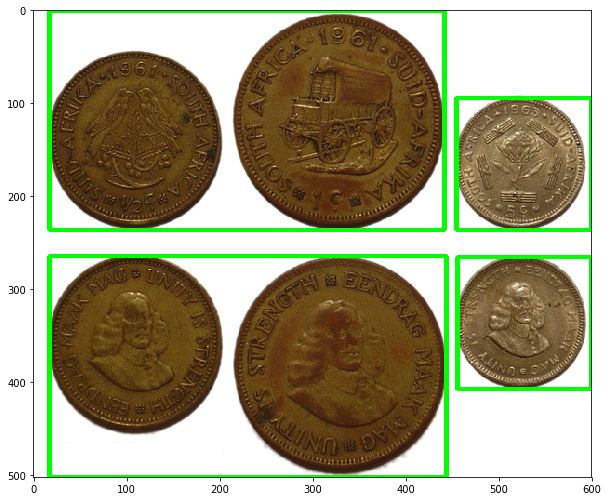

In [230]:

import numpy as np
# create copy of image to draw bounding boxes
bounding_img = np.copy(coins)

# for each contour find bounding box and draw rectangle
for contour in large_contours:
    x, y, w, h = cv2.boundingRect(contour)
    cv2.rectangle(bounding_img, (x, y), (x + w, y + h), (0, 255, 0), 3)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(bounding_img, cv2.COLOR_BGR2RGB))

cv2.imwrite('output/coins-bounding.jpg', bounding_img)

## Edge detection
Canny edge detector on OpenCV. Usage of edge detection versus thresholding to obtain binary image.

In [234]:
!ls images/img5_rect.jpg

ls: cannot access 'images/img5_rect.jpg': No such file or directory


True

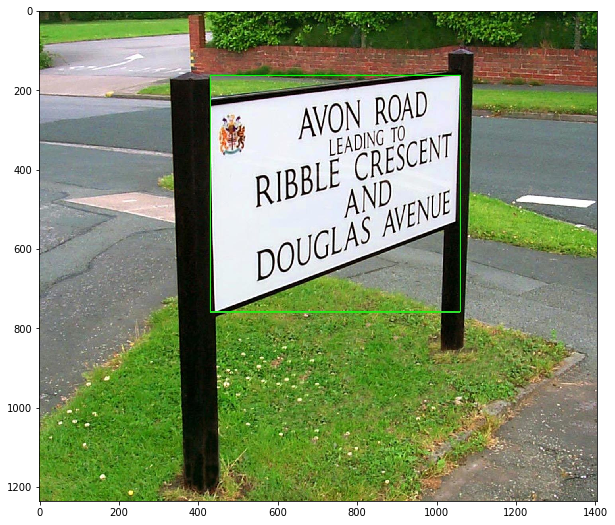

In [235]:
cups = cv2.imread('images/img5_rect.jpg')
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(cups, cv2.COLOR_BGR2RGB))
cv2.imwrite('output/img5_rect-orig.jpg', cups)

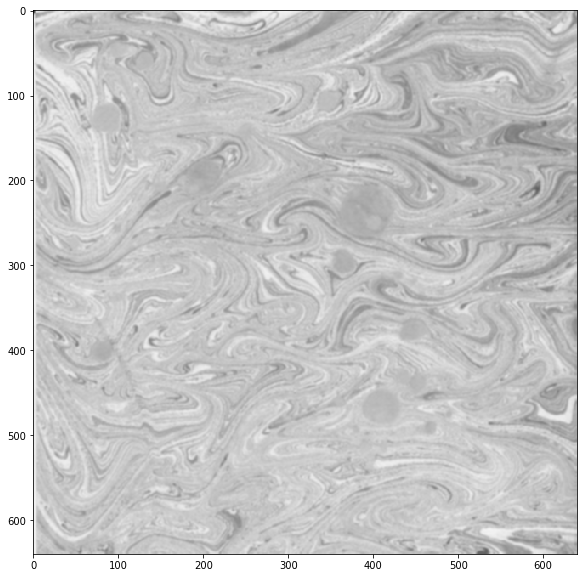

In [236]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
 
img2 = cv2.imread('images/input16.jpg')
coins_gray2 = cv2.cvtColor(img2,cv2.COLOR_BGR2GRAY)

coins_preprocessed2 = cv2.GaussianBlur(coins_gray2, (5, 5), 0)
plt.figure(figsize=(10,10))

plt.imshow(cv2.cvtColor(coins_preprocessed2, cv2.COLOR_GRAY2RGB))

True

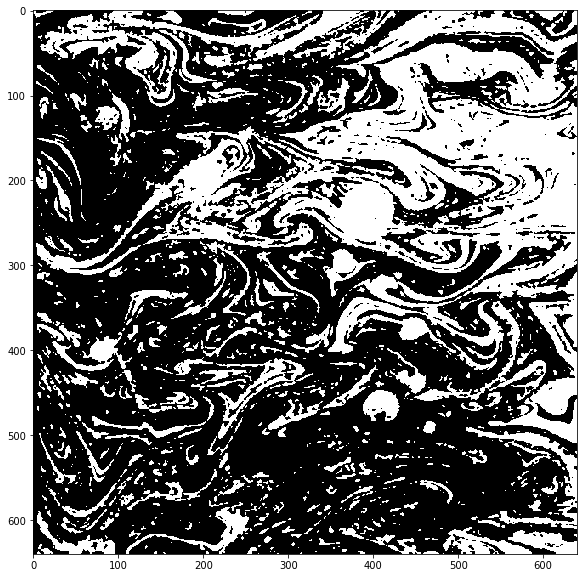

In [237]:
_, coins_binary2 = cv2.threshold(coins_preprocessed2, 190, 255, cv2.THRESH_BINARY)

# invert image to get coins
coins_binary2 = cv2.bitwise_not(coins_binary2)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(coins_binary2, cv2.COLOR_GRAY2RGB))
cv2.imwrite('images/binary.png', coins_binary2)

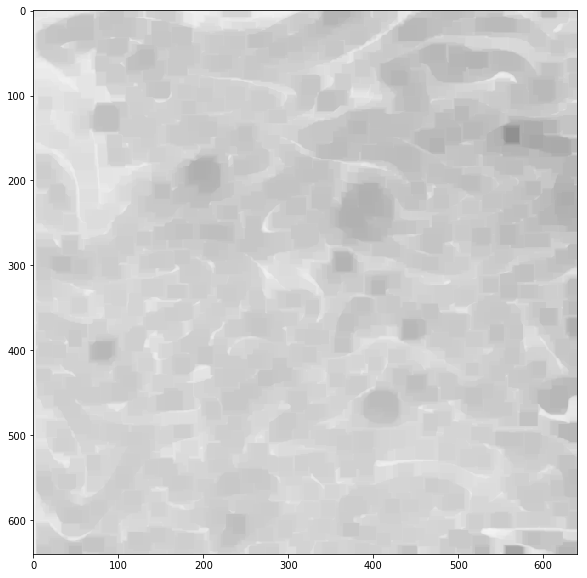

In [238]:
# morph coins by eroding and dilating to remove noise
morph_kernel = np.ones((15,15),np.uint8)
coins_morph = cv2.morphologyEx(coins_preprocessed2, cv2.MORPH_CLOSE, morph_kernel)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(coins_morph, cv2.COLOR_GRAY2RGB))

True

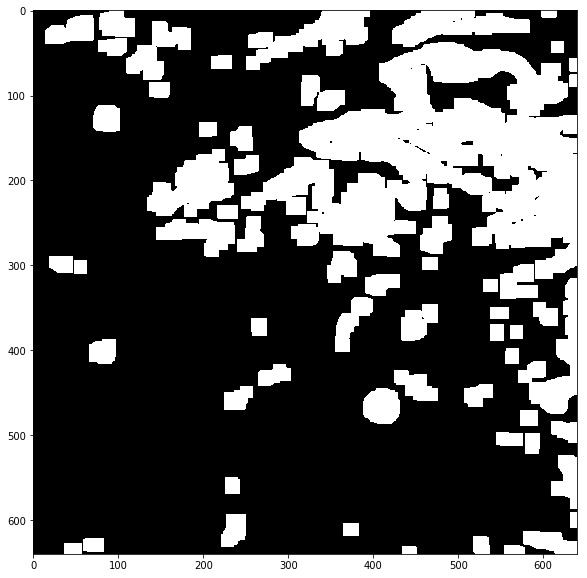

In [239]:
_, coins_binary2 = cv2.threshold(coins_morph, 200, 255, cv2.THRESH_BINARY)

# invert image to get coins
coins_binary2 = cv2.bitwise_not(coins_binary2)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(coins_binary2, cv2.COLOR_GRAY2RGB))
cv2.imwrite('images/binary.png', coins_binary2)

In [240]:
# preprocess by blurring and grayscale
cups_preprocessed  = cv2.cvtColor(cv2.GaussianBlur(cups, (7,7), 0), cv2.COLOR_BGR2GRAY)

True

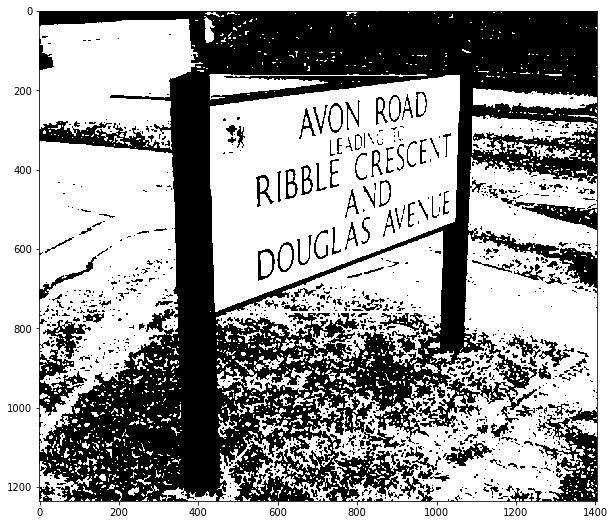

In [241]:
# find binary image with thresholding
low_thresh = 120
high_thresh = 200
_, cups_thresh = cv2.threshold(cups_preprocessed, low_thresh, 255, cv2.THRESH_BINARY)

plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(cups_thresh, cv2.COLOR_GRAY2RGB))
cv2.imwrite('output/cups-thresh-low.png', cups_thresh)

_, cups_thresh_hi = cv2.threshold(cups_preprocessed, high_thresh, 255, cv2.THRESH_BINARY)
cv2.imwrite('output/cups-thresh-hi.png', cups_thresh_hi)

True

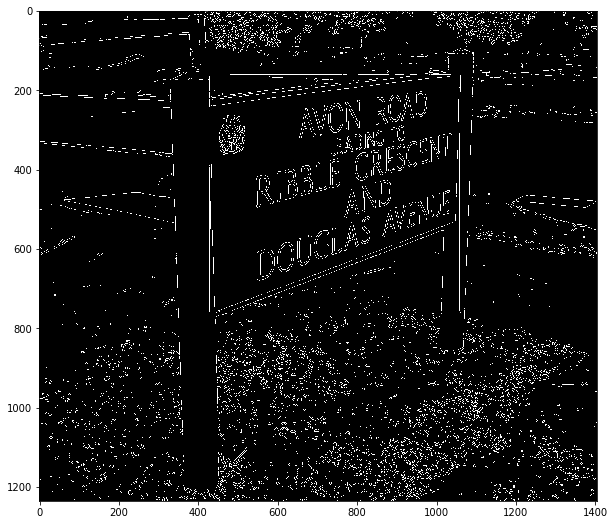

In [242]:
# find binary image with edges
cups_edges = cv2.Canny(cups_preprocessed, threshold1=90, threshold2=110)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(cups_edges, cv2.COLOR_GRAY2RGB))
cv2.imwrite('output/cups-edges.png', cups_edges)

---

## Hough Transform 

Example of using cv2.HoughCircles and cv2.HoughLines to detect circles and lines on an image

number of circles detected: 36


True

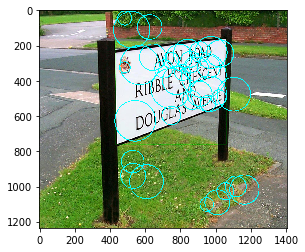

In [243]:
# find hough circles
import cv2
circles = cv2.HoughCircles(cups_edges, cv2.HOUGH_GRADIENT, dp=1.5, minDist=50, minRadius=20, maxRadius=130)
cups_circles = np.copy(cups)

# if circles are detected, draw them
if circles is not None and len(circles) > 0:
    for (x, y, r) in circles[0]:
        x, y, r = int(x), int(y), int(r)
        cv2.circle(cups_circles, (x, y), r, (255, 255, 0), 4)
        #plt.figure(figsize=(10,10))
        plt.imshow(cv2.cvtColor(cups_circles, cv2.COLOR_BGR2RGB))

print('number of circles detected: %d' % len(circles[0]))
cv2.imwrite('output/cups-circles.jpg', cups)

True

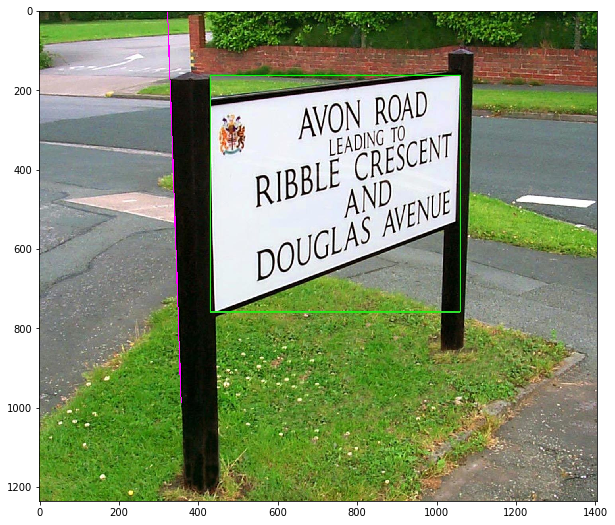

In [244]:
# line detection

# copy of image to draw lines
cups_lines = np.copy(cups)

# find hough lines
num_pix_threshold = 110 # minimum number of pixels that must be on a line
lines = cv2.HoughLines(cups_edges, 1, np.pi/180, num_pix_threshold)

for rho, theta in lines[0]:
    # convert line equation into start and end points of line
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho 
    y0 = b * rho 

    x1 = int(x0 + 1000*(-b))
    y1 = int(y0 + 1000*(a))

    x2 = int(x0 - 1000*(-b))
    y2 = int(y0 - 1000*(a))

    cv2.line(cups_lines, (x1,y1), (x2,y2), (255,0,255), 2)
    plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(cups_lines, cv2.COLOR_BGR2RGB))
cv2.imwrite('output/cups-lines.jpg', cups_lines)


In [245]:
print('The end!')

The end!
